In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_curve, roc_auc_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier

from statsmodels.tsa.arima.model import ARIMA

!pip install tslearn
from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

!pip uninstall -y pandas-profiling
!pip install --upgrade ydata-profiling
from ydata_profiling import ProfileReport

%matplotlib inline

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 82.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=6b9ca785341b708c548d3ae887ee7b0413bf084f37802c279bdac0bff3f0ef4f
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
# Connecting Google Colab to the drive (SD)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Define the correct file path -- Shared drive to grant everyone access (SD)
file_path = "/content/aggregated_plane_crash_data.xlsx"

# Read the Excel file
df = pd.read_excel(file_path)

# Display the first ten rows
df.head(10)


,Unnamed: 0,Date,Time,Location,Operator,Flight,Route,AC Type,Type,Registration,cn / ln,Aboard,Fatalities,Ground,Summary
0,0,"October 30, 1919",?,"Long Valley, New Jersey",US Aerial Mail Service,?,?,De Havilland DH.4,NaN,77,77,1 (passengers:0 crew:1),1 (passengers:0 crew:1),0,While on a mail flight to New York the pilot e...
1,1,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,1.0,?,1,2 (passengers:1 crew:1),1 (passengers:1 crew:0),0,"During a demonstration flight, a U.S. Army fly..."
2,2,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,1.0,SC1,?,1 (passengers:0 crew:1),1 (passengers:0 crew:0),0,Eugene Lefebvre was the first pilot to ever be...
3,3,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,1.0,?,?,5 (passengers:0 crew:5),5 (passengers:0 crew:5),0,First U.S. dirigible Akron exploded just offsh...
4,4,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,1.0,?,?,1 (passengers:0 crew:1),1 (passengers:0 crew:1),0,The first fatal airplane accident in Canada oc...
5,5,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),1.0,?,?,20 (passengers:? crew:?),14 (passengers:? crew:?),0,The airship flew into a thunderstorm and encou...
6,6,"October 17, 1913",1030,"Near Johannisthal, Germany",Military - German Navy,?,?,Zeppelin L-2 (airship),1.0,?,?,30 (passengers:? crew:?),30 (passengers:? crew:?),0,Hydrogen gas which was being vented was sucked...
7,7,"March 05, 1915",0100,"Tienen, Belgium",Military - German Navy,?,?,Zeppelin L-8 (airship),1.0,?,?,41 (passengers:? crew:?),21 (passengers:? crew:?),0,Crashed into trees while attempting to land af...
8,8,"September 03, 1915",1520,"Off Cuxhaven, Germany",Military - German Navy,?,?,Zeppelin L-10 (airship),1.0,?,?,19 (passengers:? crew:?),19 (passengers:? crew:?),0,"Exploded and burned near Neuwerk Island, when..."
9,9,"July 28, 1916",?,"Near Jambol, Bulgeria",Military - German Army,?,?,Schutte-Lanz S-L-10 (airship),1.0,?,?,20 (passengers:? crew:?),20 (passengers:? crew:?),0,"Crashed near the Black Sea, cause unknown."


In [ ]:
# Generate the profiling report
profile = ProfileReport(df, title="Plane Crash Data Report", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:03<00:00,  4.17it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Drop Unnecessary Columns
df.drop(columns=["Unnamed: 0", "Type", "Flight", "Ground"], inplace=True)

In [ ]:
#  Drop Rows with Too Many Missing Values
# drop rows where Flight, Route, Registration, cn / ln, and Summary are missing
df.dropna(subset=["Route", "Registration", "cn / ln", "Summary"], inplace=True)

In [ ]:
# Handle Partial Missing Data
# since the missing percentages are low, drop only those specific rows
df.dropna(subset=["Time", "Location", "Operator", "AC Type"], inplace=True)

In [ ]:
# Remove Duplicates
df.drop_duplicates(subset=["Time", "Location", "Operator", "Route", "AC Type"], inplace=True)

In [ ]:
# Reset Index
df.reset_index(drop=True, inplace=True)


In [ ]:
# Re-Generate Profiling Report
profile = ProfileReport(df, title="Plane Crash Data Report")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 11/11 [00:03<00:00,  3.34it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.head()

,Date,Time,Location,Operator,Route,AC Type,Registration,cn / ln,Aboard,Fatalities,Summary
0,"October 30, 1919",?,"Long Valley, New Jersey",US Aerial Mail Service,?,De Havilland DH.4,77,77,1 (passengers:0 crew:1),1 (passengers:0 crew:1),While on a mail flight to New York the pilot e...
1,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,?,1,2 (passengers:1 crew:1),1 (passengers:1 crew:0),"During a demonstration flight, a U.S. Army fly..."
2,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,Air show,Wright Byplane,SC1,?,1 (passengers:0 crew:1),1 (passengers:0 crew:0),Eugene Lefebvre was the first pilot to ever be...
3,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,?,?,5 (passengers:0 crew:5),5 (passengers:0 crew:5),First U.S. dirigible Akron exploded just offsh...
4,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,Curtiss seaplane,?,?,1 (passengers:0 crew:1),1 (passengers:0 crew:1),The first fatal airplane accident in Canada oc...


## Model 1: Time Series Analysis

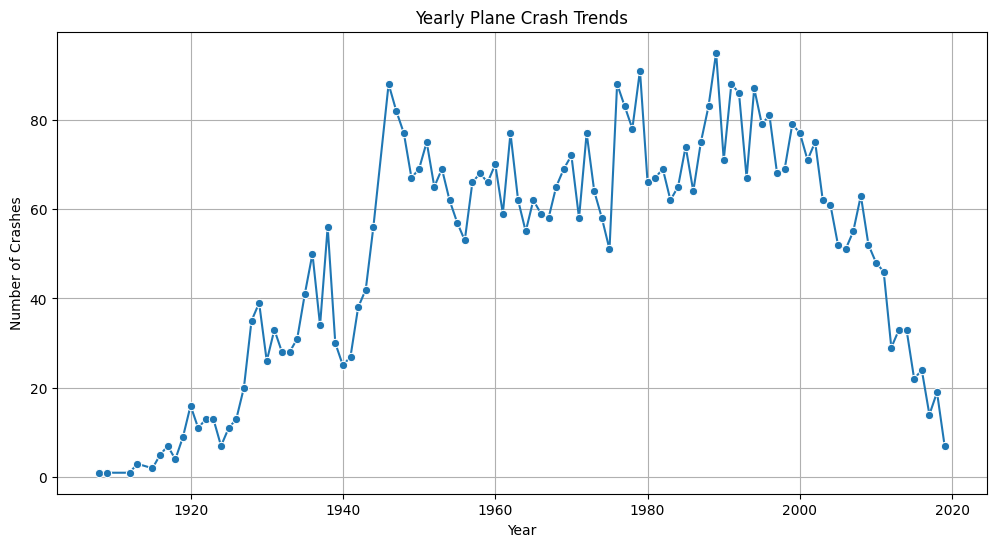

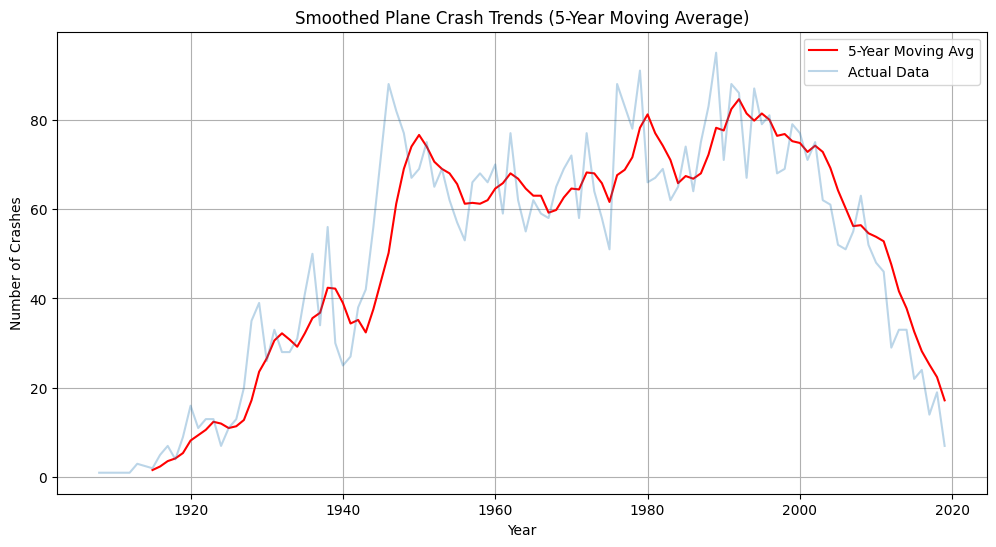

In [ ]:
# Crash Frequency Over Time
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert Date column to datetime format
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Extract Year and Month
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month

# Drop rows where Year is missing
df = df.dropna(subset=['Year'])

# Convert Year to integer
df['Year'] = df['Year'].astype(int)

# Aggregate crashes by Year
crash_trend = df.groupby('Year').size().reset_index(name='Crash Count')

# Plot crash trends over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=crash_trend, x='Year', y='Crash Count', marker='o')
plt.title("Yearly Plane Crash Trends")
plt.xlabel("Year")
plt.ylabel("Number of Crashes")
plt.grid(True)
plt.show()

# Calculate moving average to smooth the trend (window = 5 years)
crash_trend['Moving_Avg'] = crash_trend['Crash Count'].rolling(window=5).mean()

# Plot moving average trend
plt.figure(figsize=(12, 6))
sns.lineplot(data=crash_trend, x='Year', y='Moving_Avg', color='red', label='5-Year Moving Avg')
sns.lineplot(data=crash_trend, x='Year', y='Crash Count', alpha=0.3, label='Actual Data')
plt.title("Smoothed Plane Crash Trends (5-Year Moving Average)")
plt.xlabel("Year")
plt.ylabel("Number of Crashes")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
print(yearly_crashes)

NameError: name 'yearly_crashes' is not defined

Notes:
-There is a noticeable increase in crashes from the early 20th century until the mid-20th century.
-Crashes peak around the 1970s-1990s, followed by a steady decline, likely due to advancements in aviation safety, regulations, and technology.

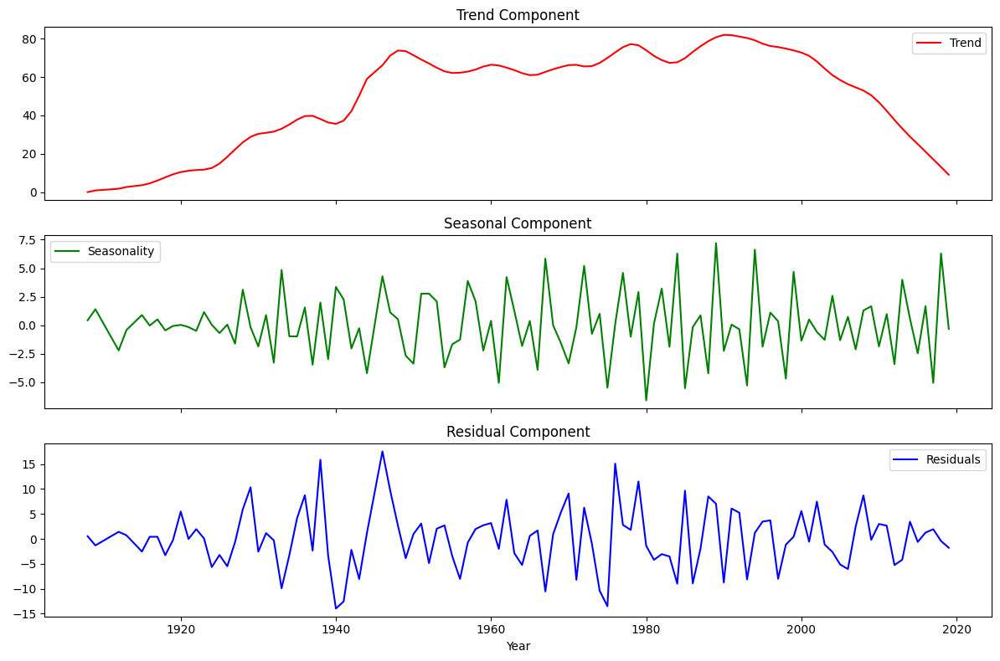

In [ ]:
# # Seasonal & Trend Decomposition (STL Decomposition)
# import statsmodels.api as sm
# # Perform STL decomposition
# decomposition = sm.tsa.STL(yearly_crashes, period=5).fit()

# # Plot decomposition
# fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

# ax1.plot(decomposition.trend, label="Trend", color="red")
# ax1.set_title("Trend Component")
# ax1.legend()

# ax2.plot(decomposition.seasonal, label="Seasonality", color="green")
# ax2.set_title("Seasonal Component")
# ax2.legend()

# ax3.plot(decomposition.resid, label="Residuals", color="blue")
# ax3.set_title("Residual Component")
# ax3.legend()

# plt.xlabel("Year")
# plt.tight_layout()
# plt.show()

import statsmodels.api as sm
import matplotlib.pyplot as plt

# Ensure the correct data is used for STL decomposition
yearly_crashes = crash_trend.set_index('Year')['Crash Count']

# Perform STL decomposition
decomposition = sm.tsa.STL(yearly_crashes, period=5).fit()

# Plot decomposition
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

ax1.plot(yearly_crashes.index, decomposition.trend, label="Trend", color="red")
ax1.set_title("Trend Component")
ax1.legend()

ax2.plot(yearly_crashes.index, decomposition.seasonal, label="Seasonality", color="green")
ax2.set_title("Seasonal Component")
ax2.legend()

ax3.plot(yearly_crashes.index, decomposition.resid, label="Residuals", color="blue")
ax3.set_title("Residual Component")
ax3.legend()

plt.xlabel("Year")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retv

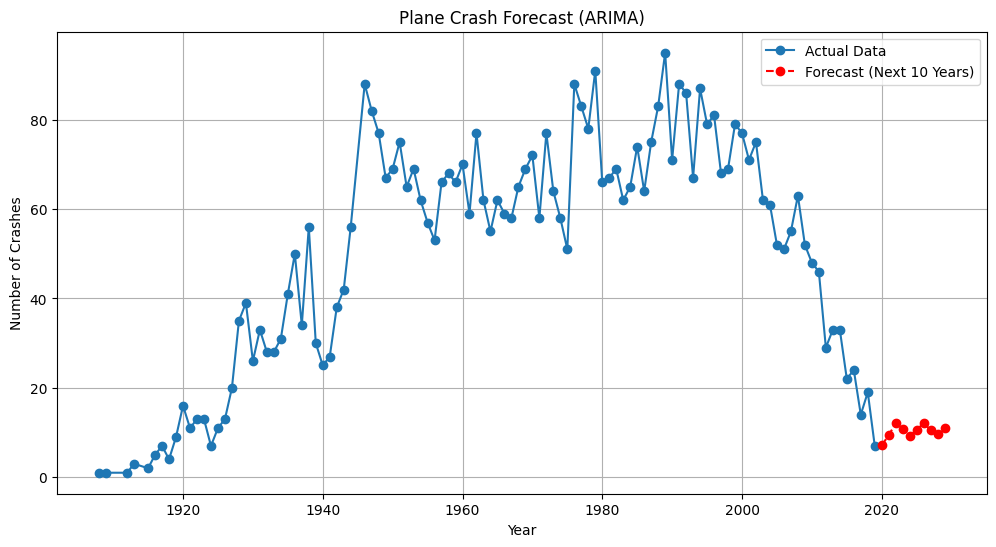

In [ ]:
# Forecasting Future Plane Crash Trends (ARIMA)
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA model (Auto-order selection works but can be fine-tuned)
model = ARIMA(yearly_crashes, order=(3,1,3))
model_fit = model.fit()

# Forecast for next 10 years
future_years = range(yearly_crashes.index[-1] + 1, yearly_crashes.index[-1] + 11)
forecast = model_fit.forecast(steps=10)

# Plot actual & forecasted values
plt.figure(figsize=(12, 6))
plt.plot(yearly_crashes, label="Actual Data", marker='o')
plt.plot(future_years, forecast, label="Forecast (Next 10 Years)", marker='o', linestyle='dashed', color='red')
plt.xlabel("Year")
plt.ylabel("Number of Crashes")
plt.title("Plane Crash Forecast (ARIMA)")
plt.legend()
plt.grid(True)
plt.show()


### Time Series Analysis Result
##### Yearly Trends:
The number of plane crashes increased significantly from the early 1900s, peaked around the mid-20th century, and has been in steady decline since the early 2000s.
##### Moving Average (5-Year):
The smoothed trend confirms long-term patterns, reducing short-term fluctuations while reinforcing the overall peak and decline.
##### Trend Decomposition:
The data shows a strong downward trend over time, with minimal seasonal variation. Residuals appear random, suggesting no recurring yearly patterns.
##### ARIMA Forecast:
The model predicts a stable number of crashes in the next decade, with no major increases or decreases, reflecting improved aviation safety.

### Potential Next Steps
-Investigate specific periods with high crash frequencies and potential causes (e.g., war, aviation technology shifts).

-Explore correlations between crash frequency and operational factors (e.g., airline, aircraft type, location).

-Proceed with geospatial analysis to identify high-risk areas and assess regional trends.


## Model 2: Natural Language Processing Analysis

In [ ]:
import nltk
nltk.download('punkt_tab')


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
# # Text Processing
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize

# # Download NLTK resources if not already present
# nltk.download('stopwords')
# nltk.download('punkt')

# if 'Summary' in df.columns:

#     def clean_text(text):
#         text = str(text).lower()
#         text = re.sub(r'\d+', '', text)
#         text = re.sub(r'[^\w\s]', '', text)
#         words = word_tokenize(text)
#         words = [word for word in words if word not in stopwords.words('english')]
#         return ' '.join(words)

#     # Apply text cleaning
#     df['Cleaned_Summary'] = df['Summary'].apply(clean_text)

#     # Display some cleaned summaries
#     print(df[['Summary', 'Cleaned_Summary']].head(10))

# else:
#     print("No 'Summary' column found in the dataset.")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                             Summary  \
0  While on a mail flight to New York the pilot e...   
1  During a demonstration flight, a U.S. Army fly...   
2  Eugene Lefebvre was the first pilot to ever be...   
3  First U.S. dirigible Akron exploded just offsh...   
4  The first fatal airplane accident in Canada oc...   
5  The airship flew into a thunderstorm and encou...   
6  Hydrogen gas which was being vented was sucked...   
7  Crashed into trees while attempting to land af...   
8  Exploded and burned near Neuwerk Island,  when...   
9         Crashed near the Black Sea, cause unknown.   

                                     Cleaned_Summary  
0  mail flight new york pilot encountered bad wea...  
1  demonstration flight us army flyer flown orvil...  
2  eugene lefebvre first pilot ever killed air ac...  
3  first us dirigible akron exploded offshore alt...  
4  first fatal airplane accident canada occurred ...  
5  airship flew thunderstorm encountered severe d... 

In [ ]:
# # Keyword Extraction
# from sklearn.feature_extraction.text import TfidfVectorizer

# # Initialize TF-IDF Vectorizer
# vectorizer = TfidfVectorizer(max_features=20, stop_words='english')
# tfidf_matrix = vectorizer.fit_transform(df['Cleaned_Summary'])

# # Get feature names
# keywords = vectorizer.get_feature_names_out()

# # Display top keywords
# print("Top Keywords in Crash Summaries:", keywords)


Top Keywords in Crash Summaries: ['aircraft' 'airport' 'altitude' 'approach' 'conditions' 'control'
 'crashed' 'crew' 'engine' 'failure' 'flight' 'land' 'landing' 'mountain'
 'pilot' 'plane' 'runway' 'takeoff' 'taking' 'weather']


In [ ]:
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
nltk.download('averaged_perceptron_tagger')


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
import re
import nltk
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk import pos_tag, ne_chunk
from nltk.tree import Tree
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download NLTK resources if not already present
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')

# Initialize the stopwords, lemmatizer, and sentiment analyzer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()
sia = SentimentIntensityAnalyzer()

# Function to clean and preprocess text
def clean_text(text):
    """
    Clean the text by converting to lowercase, removing digits,
    punctuation, and stopwords. Perform tokenization, and lemmatization.
    """
    text = str(text).lower()  # Convert to lowercase
    text = re.sub(r'\d+', '', text)  # Remove digits
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    words = word_tokenize(text)  # Tokenize the text
    words = [word for word in words if word not in stop_words]  # Remove stopwords

    # Lemmatization
    words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(words)

# Handle missing or NaN values in the 'Summary' column
if 'Summary' in df.columns:
    df['Cleaned_Summary'] = df['Summary'].fillna('').apply(clean_text)
    print("Cleaned Summaries (First 10):")
    print(df[['Summary', 'Cleaned_Summary']].head(10))
else:
    print("No 'Summary' column found in the dataset.")

# --- Named Entity Recognition (NER) ---
def extract_named_entities(text):
    """
    Extract named entities from text using NLTK's NER chunking.
    """
    words = word_tokenize(text)
    tagged_words = pos_tag(words)
    tree = ne_chunk(tagged_words)

    named_entities = []
    for subtree in tree:
        if isinstance(subtree, Tree):
            entity = " ".join([word for word, tag in subtree])
            named_entities.append(entity)
    return named_entities

# Extract Named Entities from the summaries
df['Named_Entities'] = df['Cleaned_Summary'].apply(extract_named_entities)
print("\nNamed Entities (First 10):")
print(df[['Cleaned_Summary', 'Named_Entities']].head(10))

# --- N-gram Keyword Extraction ---
# Create bigrams and extract keywords using TF-IDF
vectorizer = TfidfVectorizer(ngram_range=(1, 2), max_features=20, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['Cleaned_Summary'])
keywords = vectorizer.get_feature_names_out()

print("\nTop Keywords in Crash Summaries (including bigrams):")
print(keywords)

# --- Sentiment Analysis ---
def get_sentiment(text):
    """
    Perform sentiment analysis and classify text as positive, neutral, or negative.
    """
    sentiment_score = sia.polarity_scores(text)['compound']
    if sentiment_score >= 0.05:
        return 'Positive'
    elif sentiment_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

df['Sentiment'] = df['Cleaned_Summary'].apply(get_sentiment)
print("\nSentiment Analysis (First 10):")
print(df[['Cleaned_Summary', 'Sentiment']].head(10))

# --- Visualize Word Frequency with WordCloud ---
all_words = ' '.join(df['Cleaned_Summary'])
wordcloud = WordCloud(stopwords=stop_words, background_color='white', width=800, height=400).generate(all_words)

# Plot the WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


Cleaned Summaries (First 10):
                                             Summary  \
0  While on a mail flight to New York the pilot e...   
1  During a demonstration flight, a U.S. Army fly...   
2  Eugene Lefebvre was the first pilot to ever be...   
3  First U.S. dirigible Akron exploded just offsh...   
4  The first fatal airplane accident in Canada oc...   
5  The airship flew into a thunderstorm and encou...   
6  Hydrogen gas which was being vented was sucked...   
7  Crashed into trees while attempting to land af...   
8  Exploded and burned near Neuwerk Island,  when...   
9         Crashed near the Black Sea, cause unknown.   

                                     Cleaned_Summary  
0  mail flight new york pilot encountered bad wea...  
1  demonstration flight u army flyer flown orvill...  
2  eugene lefebvre first pilot ever killed air ac...  
3  first u dirigible akron exploded offshore alti...  
4  first fatal airplane accident canada occurred ...  
5  airship flew thunder

LookupError: 
**********************************************************************
  Resource [93maveraged_perceptron_tagger_eng[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('averaged_perceptron_tagger_eng')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mtaggers/averaged_perceptron_tagger_eng/[0m

  Searched in:
    - '/root/nltk_data'
    - '/usr/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/share/nltk_data'
    - '/usr/local/share/nltk_data'
    - '/usr/lib/nltk_data'
    - '/usr/local/lib/nltk_data'
**********************************************************************


Notes:

pilot, crew, control → Suggests a focus on human factors in crashes (e.g., pilot error, loss of control).

engine, failure, aircraft → Indicates crashes often involved engine failures or aircraft malfunctions.

takeoff, landing, approach, altitude → Crashes seem to be concentrated around takeoff/landing, the most critical flight phases.

weather, conditions, ground → Suggests that bad weather and terrain factors contributed to incidents.

In [ ]:
#Topic Modeling (LDA)
from sklearn.decomposition import LatentDirichletAllocation

# Initialize LDA model
lda_model = LatentDirichletAllocation(n_components=3, random_state=42)
lda_matrix = lda_model.fit_transform(tfidf_matrix)

# Get topic-word distribution
terms = vectorizer.get_feature_names_out()
topics = {}
for topic_idx, topic in enumerate(lda_model.components_):
    topics[f"Topic {topic_idx+1}"] = [terms[i] for i in topic.argsort()[:-6:-1]]

# Display topics
import pandas as pd
pd.DataFrame(topics)


,Topic 1,Topic 2,Topic 3
0,runway,flight,crashed
1,engine,pilot,plane
2,crew,failure,aircraft
3,landing,mountain,taking
4,land,weather,airport


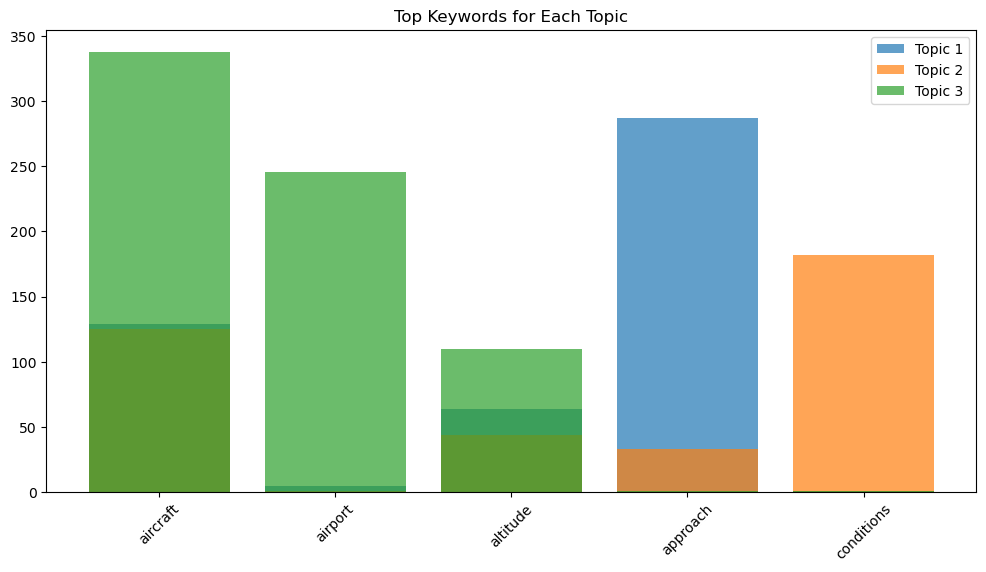

In [ ]:
# Visualize Word Distribution for Each Topic
import matplotlib.pyplot as plt
import numpy as np

topics_df = pd.DataFrame(lda_model.components_, index=[f"Topic {i+1}" for i in range(3)], columns=terms)

plt.figure(figsize=(12,6))
for i in range(3):
    plt.bar(np.arange(5), topics_df.iloc[i, :5], alpha=0.7, label=f"Topic {i+1}")

plt.xticks(np.arange(5), terms[:5], rotation=45)
plt.legend()
plt.title("Top Keywords for Each Topic")
plt.show()


In [ ]:
#Sentiment Analysis
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

# Initialize sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Apply VADER Sentiment Scoring
df["Sentiment_Score"] = df["Cleaned_Summary"].apply(lambda x: analyzer.polarity_scores(str(x))["compound"])

# Apply TextBlob Sentiment Scoring
df["TextBlob_Score"] = df["Cleaned_Summary"].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# Display results
from IPython.display import display
display(df[["Cleaned_Summary", "Sentiment_Score", "TextBlob_Score"]].head(20))


,Cleaned_Summary,Sentiment_Score,TextBlob_Score
0,plane failed gain altitude taking criclklewood...,-0.8910,-0.062500
1,midair collision occurred ft poor visibility a...,-0.9595,-0.264286
2,lost engine could make emergency landing gusty...,-0.6908,0.000000
3,brokeup mid air suffering structural failure f...,-0.9246,-0.105556
4,aircraft lost engine minutes flight plane inca...,-0.8591,-0.025000
5,crashed attempting forced landing encountering...,-0.4588,-0.250000
6,shortly taking witnesses observed puff white s...,-0.9118,-0.148810
7,crashed ground descending poor weather,-0.4767,-0.400000
8,engine fire pilot attempts make emergency land...,-0.6124,0.000000
9,plane flight london paris power lost starboard...,-0.1531,-0.012500


Columns in dataset: Index(['Date', 'Time', 'Location', 'Operator', 'Route', 'AC_Type',
       'Registration', 'cn_ln', 'Aboard', 'Fatalities', 'Summary', 'Year',
       'Month'],
      dtype='object')
        Keyword 1 Keyword 2 Keyword 3 Keyword 4 Keyword 5
Cluster                                                  
0           route        en   crashed     plane  aircraft
1        aircraft    engine   crashed     plane    taking
2        approach   crashed    runway  aircraft   weather


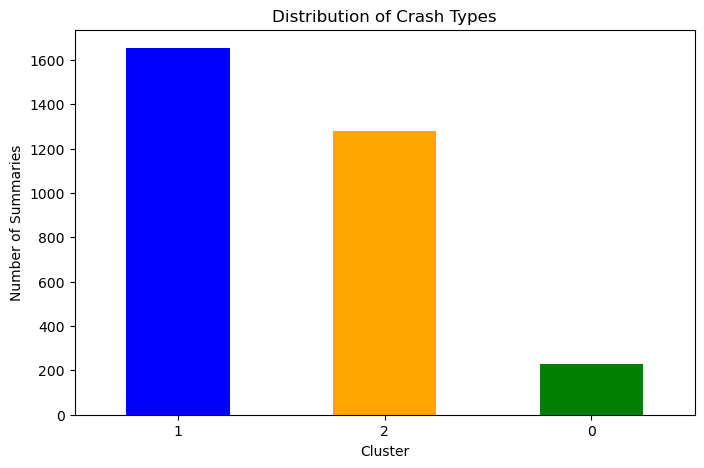

In [ ]:
#Crash Type Clustering
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Check column names
print("Columns in dataset:", df.columns)

expected_col = "Cleaned_Summary"
if expected_col not in df.columns:
    matching_col = [col for col in df.columns if "summary" in col.lower()]
    if matching_col:
        df.rename(columns={matching_col[0]: expected_col}, inplace=True)
    else:
        raise KeyError(f"Column '{expected_col}' not found in dataset.")

# TF-IDF Vectorization
vectorizer = TfidfVectorizer(stop_words="english", max_features=500)
X = vectorizer.fit_transform(df[expected_col].astype(str))

# Apply K-Means Clustering
num_clusters = 3  # Adjust if needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
df["Cluster"] = kmeans.fit_predict(X)

# Analyze cluster keywords
cluster_keywords = []
terms = vectorizer.get_feature_names_out()
for i in range(num_clusters):
    top_indices = kmeans.cluster_centers_[i].argsort()[-5:][::-1]
    top_keywords = [terms[idx] for idx in top_indices]
    cluster_keywords.append(top_keywords)

# Create a DataFrame for cluster results
cluster_df = pd.DataFrame(cluster_keywords, columns=[f"Keyword {i+1}" for i in range(5)])
cluster_df.index.name = "Cluster"

# Display results
print(cluster_df)

plt.figure(figsize=(8, 5))
df["Cluster"].value_counts().plot(kind="bar", color=["blue", "orange", "green"])
plt.xlabel("Cluster")
plt.ylabel("Number of Summaries")
plt.title("Distribution of Crash Types")
plt.xticks(rotation=0)
plt.show()


### Natural Language Processing Analysis Results
##### Top Keywords:
The most frequently used words in crash summaries include "aircraft," "airport," "altitude," "approach," "conditions," "control," "crashed," "engine," "failure," "pilot," "runway," and "weather." These keywords highlight that crashes are often linked to mechanical issues, weather conditions, and landing/takeoff challenges.

##### Topic Modeling:
Three key themes emerged from topic clustering:

-Human Factors & Landing Conditions: Crew decisions, runway approaches, and landing difficulties.

-Mechanical Failures & Weather Challenges: Engine malfunctions and adverse weather conditions.

-General Operational Incidents: Broad categories including general crashes, aircraft control, and environmental factors.

##### Sentiment Analysis:
Crash summaries are overwhelmingly negative, with most reports describing severe incidents. A few summaries are neutral, likely covering minor incidents or successful emergency landings.

##### Crash Type Clustering:
Crashes were grouped into three categories:

-Navigation-Related Crashes: Issues involving route deviations and approach difficulties.

-Mechanical Failures: The most frequent type, including engine failures and aircraft malfunctions.

-Weather & Landing-Related Crashes: Cases involving poor weather conditions and failed landings.